Paper

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [2]:
import cv2 as cv
import matplotlib.pyplot as plt
from skimage.feature import graycomatrix, graycoprops
from sklearn.metrics import accuracy_score, classification_report

from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from skimage.filters import hessian
from skimage import morphology
from sklearn.metrics import confusion_matrix
import seaborn as sb

In [4]:
def show_image(img, cmap='gray'):
    fig = plt.figure(figsize=(20,20))
    axes = fig.add_subplot(111)
    axes.imshow(img, cmap=cmap)

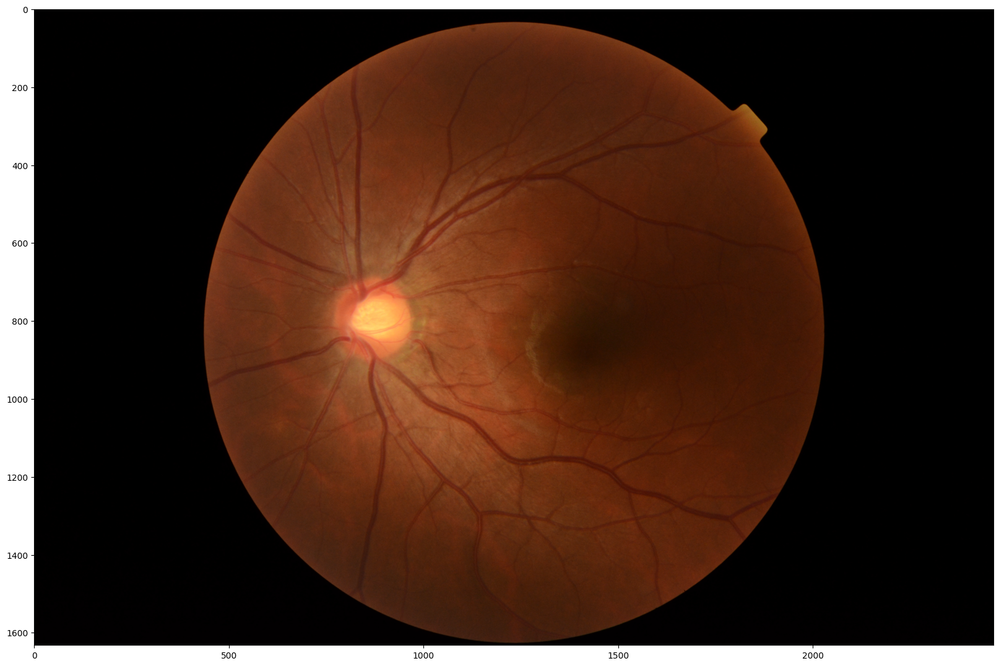

In [29]:
test_img = cv.imread('Catarac_Dataset/dataset/1_normal/NL_001.png')
test_img = cv.cvtColor(test_img, cv.COLOR_BGR2RGB)
show_image(test_img)

In [30]:
width, height, dimension = test_img.shape
print(f'Width RGB = {width}')
print(f'Height RGB = {height}')
print(f'Dimension RGB = {dimension}')

Width RGB = 1632
Height RGB = 2464
Dimension RGB = 3


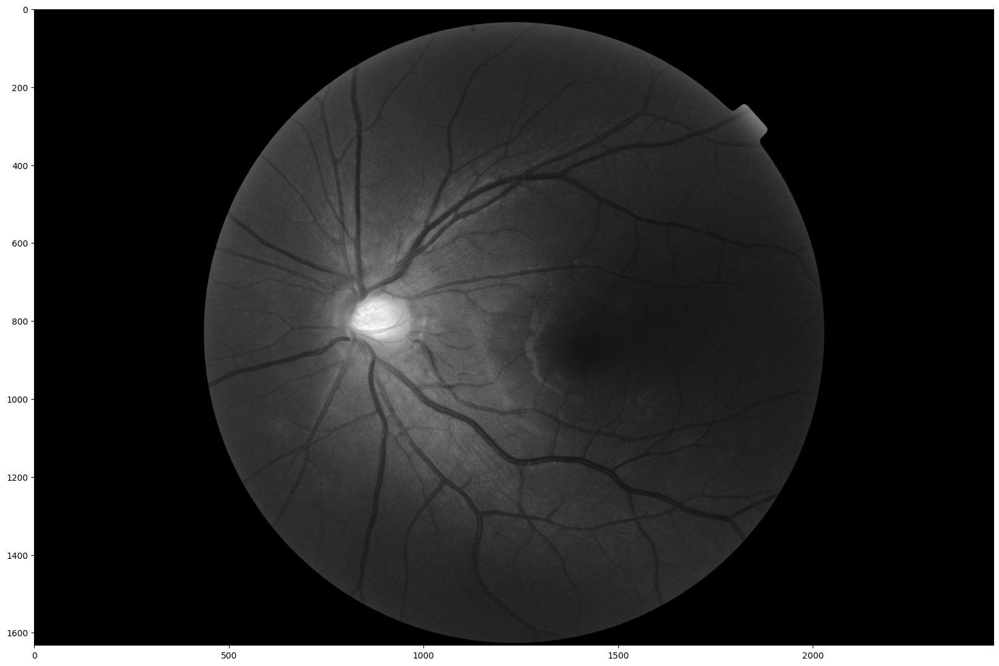

In [31]:
green_channel = test_img[:, :, 1]
show_image(green_channel)

In [32]:
width, height = green_channel.shape
print(f'Width Grayscale = {width}')
print(f'Height Grayscale = {height}')
print(f'Image Shape Grayscale {green_channel.shape}')

Width Grayscale = 1632
Height Grayscale = 2464
Image Shape Grayscale (1632, 2464)


(array([0.000000e+00, 1.753176e+06, 2.748000e+04, 2.413000e+05,
        1.463000e+03, 2.950000e+03, 3.384000e+03, 8.615000e+03,
        8.445000e+03, 2.059600e+04, 2.623100e+04, 2.187900e+04,
        3.845500e+04, 2.692500e+04, 5.209900e+04, 4.269400e+04,
        6.967600e+04, 5.409200e+04, 9.457200e+04, 6.592100e+04,
        1.068120e+05, 1.153630e+05, 7.785000e+04, 1.115500e+05,
        6.564600e+04, 9.434900e+04, 5.803500e+04, 8.150900e+04,
        5.046700e+04, 6.803100e+04, 5.836500e+04, 3.524900e+04,
        4.704600e+04, 2.856800e+04, 3.794200e+04, 2.380800e+04,
        3.251000e+04, 1.917000e+04, 2.668200e+04, 1.691600e+04,
        2.357800e+04, 2.241500e+04, 1.416400e+04, 1.970300e+04,
        1.258600e+04, 1.743000e+04, 1.093000e+04, 1.515000e+04,
        9.039000e+03, 1.257200e+04, 1.123900e+04, 6.985000e+03,
        9.336000e+03, 5.420000e+03, 7.839000e+03, 4.783000e+03,
        6.635000e+03, 4.006000e+03, 5.944000e+03, 3.600000e+03,
        5.233000e+03, 5.099000e+03, 3.30

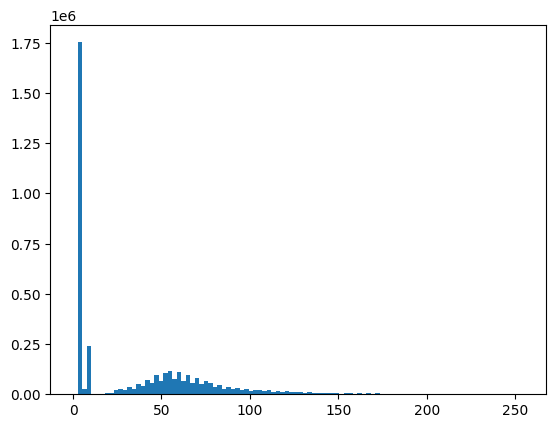

In [33]:
clahe = cv.createCLAHE(clipLimit=3, tileGridSize=(8,8))
clahe_img = clahe.apply(green_channel)
plt.hist(clahe_img.flat, bins=100, range=(0,255))

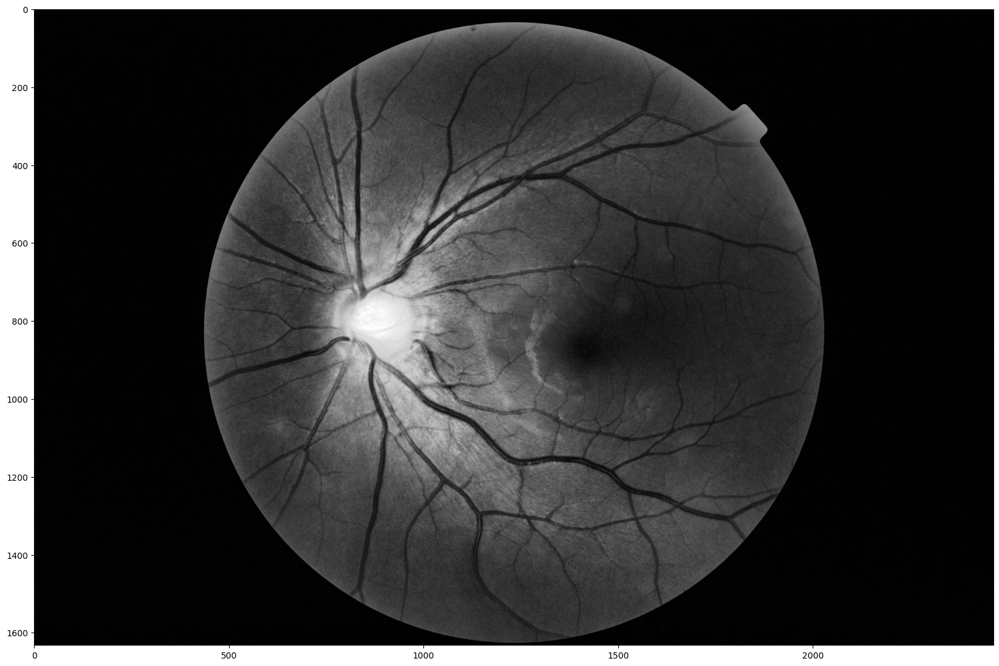

In [34]:
show_image(clahe_img)

In [35]:
#morphological operations, Here we do opening then closing
cell_disc = cv.getStructuringElement(cv.MORPH_ELLIPSE,(9,9))
Topen = cv.morphologyEx(clahe_img,cv.MORPH_OPEN,cell_disc)
Tclose = cv.morphologyEx(Topen, cv.MORPH_CLOSE, cell_disc)
# cell_disc1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))
# Tclose = cv2.morphologyEx(Topen, cv2.MORPH_DILATE, cell_disc1)

#gtting the tophat image
TopHat = (clahe_img - Tclose)#.astype(np.uint8)

Text(0.5, 1.0, 'Green Channel Original')

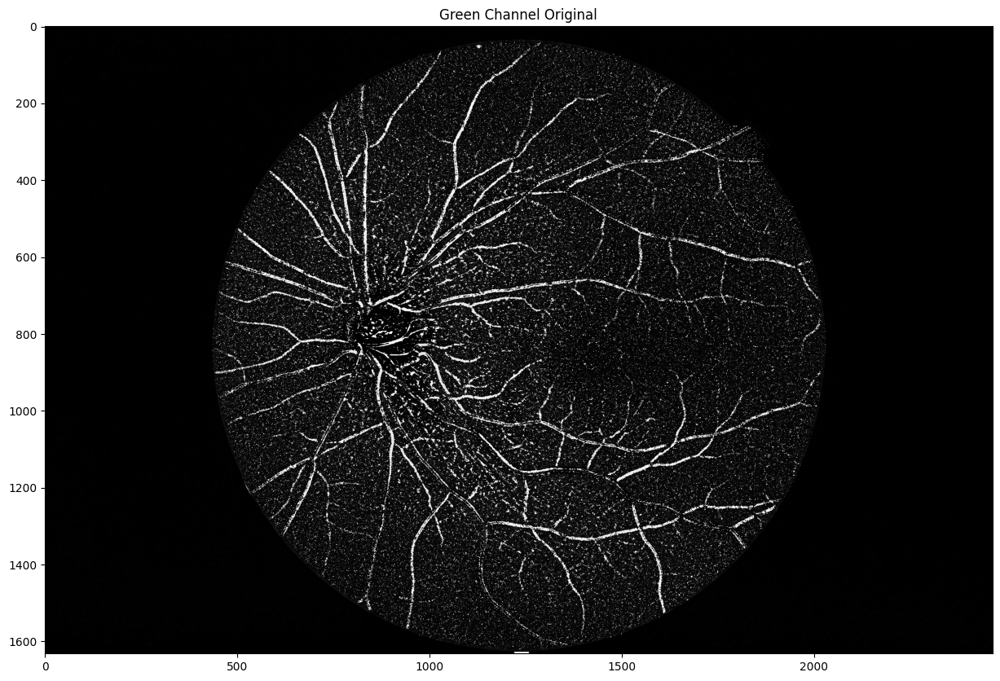

In [36]:
#checking the tophat image
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 1, 1)
plt.imshow(TopHat,cmap='gray')
plt.title('Green Channel Original')

Text(0.5, 1.0, 'Green Channel Original')

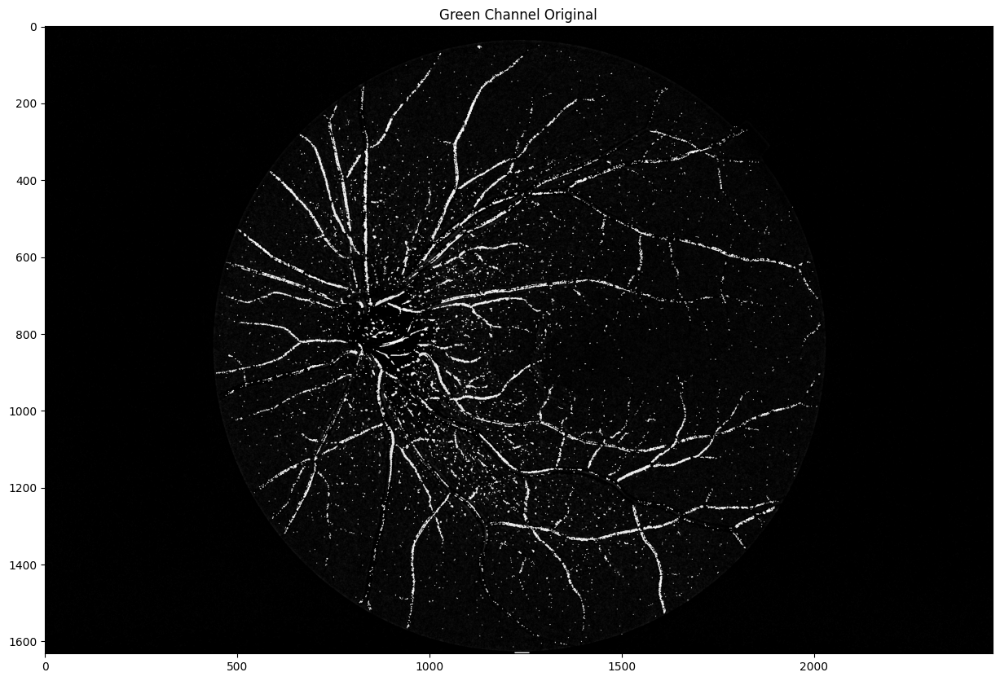

In [37]:
#More morphological operations, erosion then dilation
kernel = cv.getStructuringElement(cv.MORPH_RECT,(2,2))
min_image = cv.erode(TopHat, kernel)
min_image = cv.dilate(min_image, kernel)
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 1, 1)
plt.imshow(min_image,cmap='gray')
plt.title('Green Channel Original')

In [38]:
#thresholding function
import copy
def threshold(img,k):
    ret = copy.deepcopy(img)
    ret[ret<k] = 0
    ret[ret>=k] = 255
    return ret

C:\Users\Acer Nitro 5\AppData\Local\Temp\ipykernel_23632\1214306456.py:2: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  HessThin = hessian_matrix(min_image, sigma=1.2, order='rc')


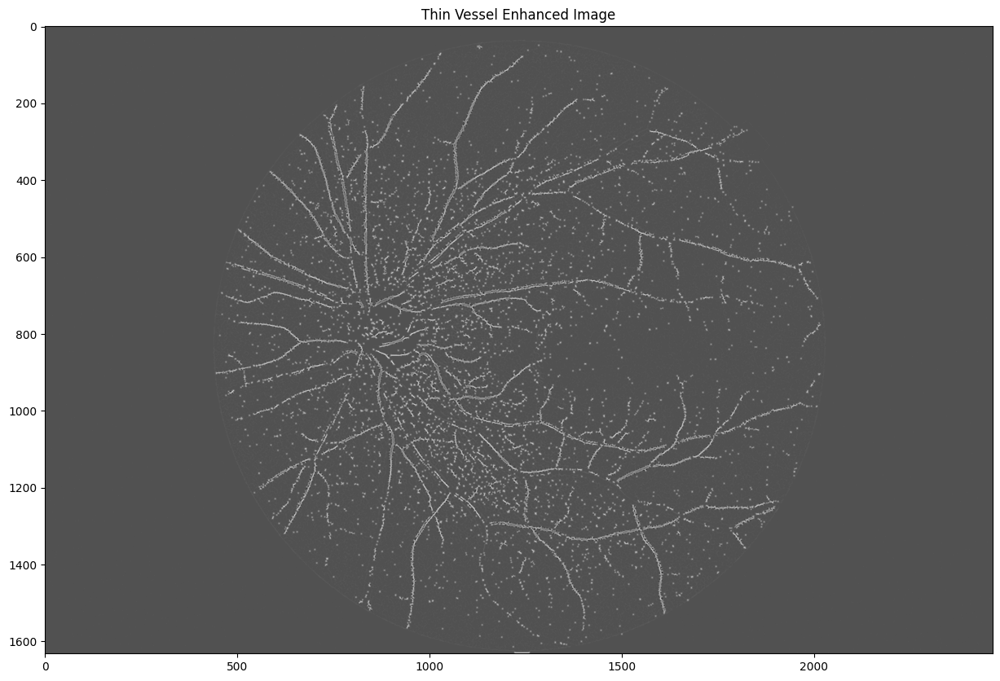

In [39]:
#hessian matrix and eigenvalues approach to get thin vessel enhanced image
HessThin = hessian_matrix(min_image, sigma=1.2, order='rc')
EignThin = hessian_matrix_eigvals(HessThin) [1]
fig = plt.figure(figsize=(20, 10))
plt.title("Thin Vessel Enhanced Image")
plt.imshow(1-EignThin, cmap=plt.cm.gray)

C:\Users\Acer Nitro 5\AppData\Local\Temp\ipykernel_23632\3152152741.py:2: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  HessWide = hessian_matrix(min_image, sigma=4, order='rc')


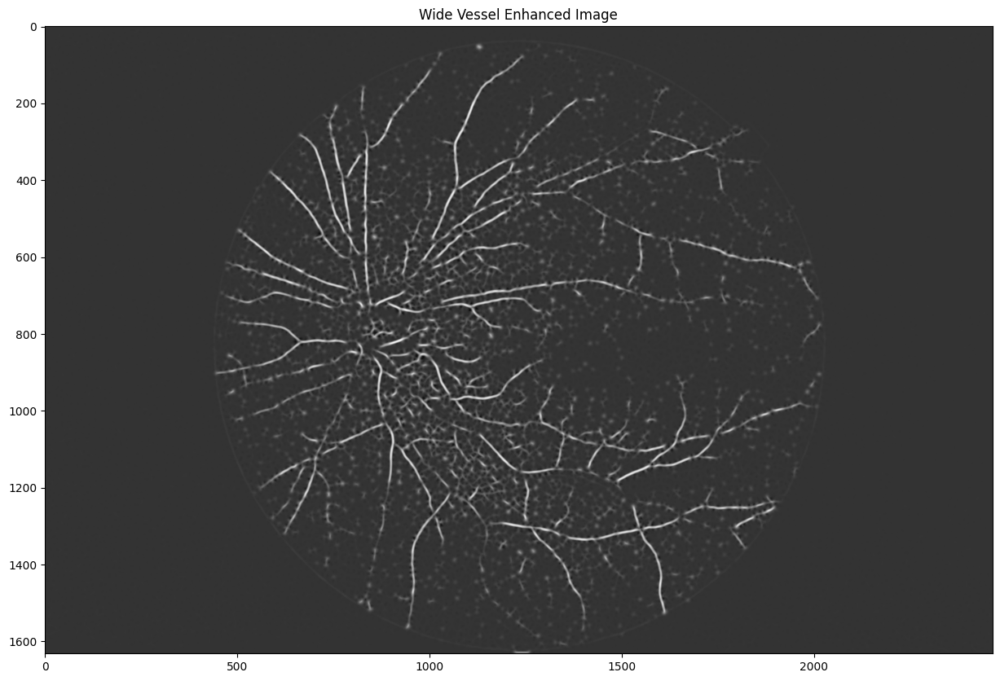

In [40]:
#hessian matrix and eigenvalues approach to get wide vessel enhanced image
HessWide = hessian_matrix(min_image, sigma=4, order='rc')
EignWide = hessian_matrix_eigvals(HessWide) [1]
fig = plt.figure(figsize=(20, 10))
plt.title("Wide Vessel Enhanced Image")
plt.imshow(1-EignWide, cmap='gray')

In [41]:
#global otsu thresholding function
def GlobalOtsu(img):
    foreground = img[img>=0]
    background = img[img<0]
    
    final_var = (np.var(foreground) * len(foreground) + np.var(background) * len(background))/(len(foreground) + len(background))
    if(np.isnan(final_var)):
        final_var = -1
        
    final_thresh = 0
    for i in np.linspace(np.min(img), np.max(img), num=255):
        foreground = img[img>=i]
        background = img[img<i]
        var = (np.var(foreground) * len(foreground) + np.var(background) * len(background))/(len(foreground) + len(background))
        
        if(np.isnan(var)):
            var = -1
            
        if(var!=-1 and (var<final_var or final_var ==-1)):
            final_var = var
            final_thresh = i
    return threshold(img,final_thresh)

In [42]:
#Area based thresholding/cleaning. Done as postprocessing step
def AreaThreshold(img, area = 5):
    nlabels,labels,stats,centroid = cv.connectedComponentsWithStats(np.uint8(img), 4, cv.CV_32S)

    output = np.copy(img)
    
    for i in range(output.shape[0]):
        for j in range(output.shape[1]):
            if stats[labels[i][j], cv.CC_STAT_AREA] < area:
                output[i][j] = 0
                
    return output

In [43]:
#different accuracy metrics used are returned by this function
def AccuracyMetrics(img,imggt):
    matches = np.copy(img[img==imggt])
    mismatches = np.copy(img[img!=imggt])
    TP = sum(matches==255)
    TN = sum(matches==0)
    FP = sum(mismatches==255)
    FN = sum(mismatches==0)
#     print(matches.shape)
#     print(mismatches.shape)
#     print("TP ",TP)
#     print("TN ",TN)
#     print("FP ",FP)
#     print("FN ",FN)
    Acc = (TP+TN)/(TP+TN+FP+FN)
    Sn = TP/(TP+FN)
    Sp = TN/(TN+FP)
    Auc = (Sn+Sp)/2
    
    return Acc,Sn,Sp,Auc

In [44]:
#Local otsu thresholding
from skimage.filters import threshold_otsu, rank
from skimage.morphology import disk

def LocalOtsu1(img,radius = 5):
    selem = disk(radius)

    local_otsu = rank.otsu(img, selem)
    output = np.copy(img)
    
    output[output < local_otsu] = 0
    output[output >= local_otsu] = 255
    
    return output

In [45]:
#local Otsu thresholding function as per paper with offset included
def LocalOtsu2(img,radius = 15):
    selem = disk(radius)

    local_otsu = rank.otsu(img, selem)
    output = np.copy(img)
    rng = local_otsu.max() - local_otsu.min()
    mid = rng/2 + local_otsu.min()

    local_otsu[local_otsu<mid] = mid

    output[output < local_otsu] = 0


    return output

In [46]:
import pywt

#using wavelet method for image fusion
def image_fusion(img1,img2):
    w1 = pywt.wavedec2(img1, 'db1')
    w2 = pywt.wavedec2(img2, 'db1')
    elem = (w1[0]+w2[0])/2
    fw = [elem]
    
    for i in range(len(w1)-1):
        x,y,z = (w1[i+1][0] + w2[i+1][0])/2, (w1[i+1][1] + w2[i+1][1])/2, (w1[i+1][2] + w2[i+1][2])/2
        fw.append((x,y,z))

    output = pywt.waverec2(fw, 'db1')
    
#     Normalisation, May or May not be required
    amin = np.min(output)
    amax = np.max(output)
    output = 255* ((output - amin)/(amax-amin))
    
    output = cv.resize(output,img1.T.shape)
    return output

c:\Users\Acer Nitro 5\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\fromnumeric.py:3715: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\Acer Nitro 5\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
c:\Users\Acer Nitro 5\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\core\_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Text(0.5, 1.0, 'GlobalThresholdedThickVessel')

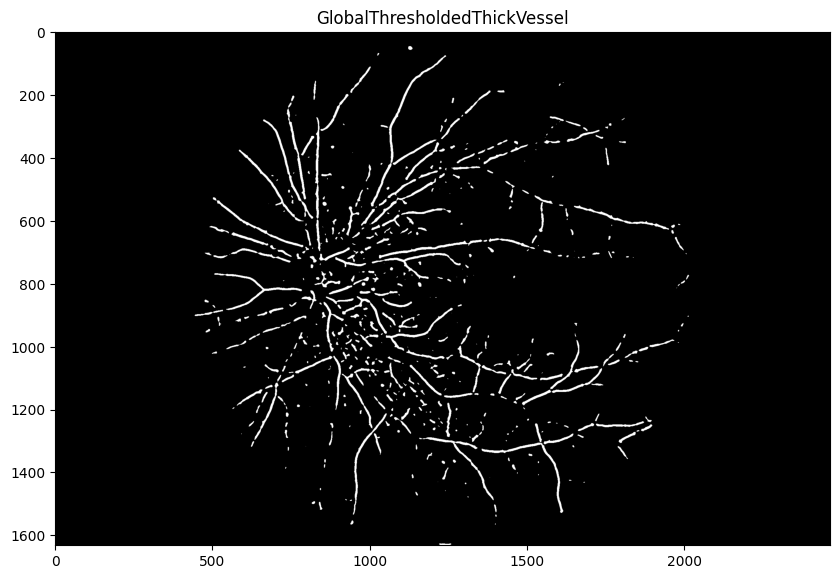

In [47]:
#Global otsu thresholding
val1 = GlobalOtsu(1-EignWide)
#Global otsu thresholded image
fig = plt.figure(figsize=(10, 10))
plt.imshow(val1,cmap='gray')
plt.title("GlobalThresholdedThickVessel")

In [48]:
#normalising the images for further processing
thinN = cv.normalize(1-EignThin,  None, 0, 255, cv.NORM_MINMAX)
val1 = cv.normalize(val1,  None, 0, 70, cv.NORM_MINMAX)

Text(0.5, 1.0, 'Thin vessels enhanced')

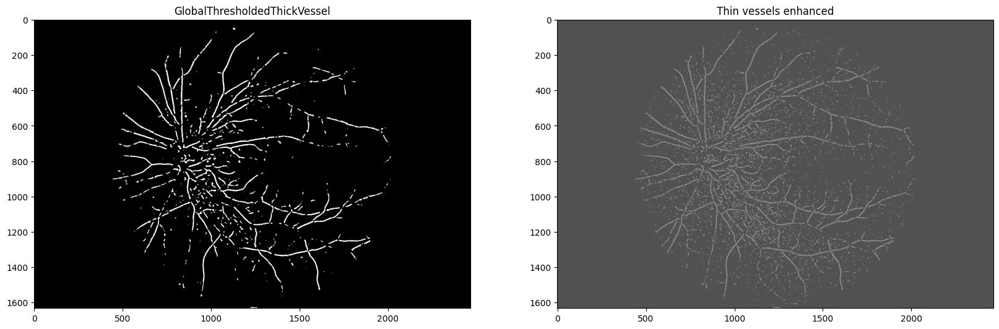

In [49]:
#Two images that have to be fused
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 2, 1)
plt.imshow(val1,cmap='gray')
plt.title('GlobalThresholdedThickVessel')
fig.add_subplot(1, 2, 2)
plt.imshow(thinN,cmap='gray')
plt.title('Thin vessels enhanced')

In [50]:
#fusing the images
test1 = image_fusion(val1,thinN)

Text(0.5, 1.0, 'Image Fusion')

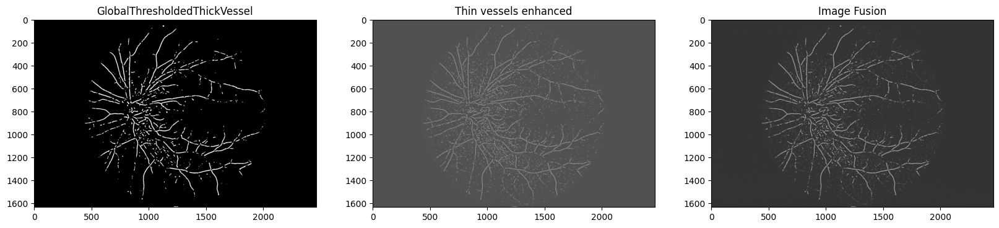

In [51]:
#comparing the fused image with originals
fig = plt.figure(figsize=(20, 10))
fig.add_subplot(1, 3, 1)
plt.imshow(val1,cmap='gray')
plt.title('GlobalThresholdedThickVessel')
fig.add_subplot(1, 3, 2)
plt.imshow(thinN,cmap='gray')
plt.title('Thin vessels enhanced')
fig.add_subplot(1, 3, 3)
plt.imshow(test1,cmap='gray')
plt.title("Image Fusion")

Text(0.5, 1.0, 'Local Otsu Thresholding')

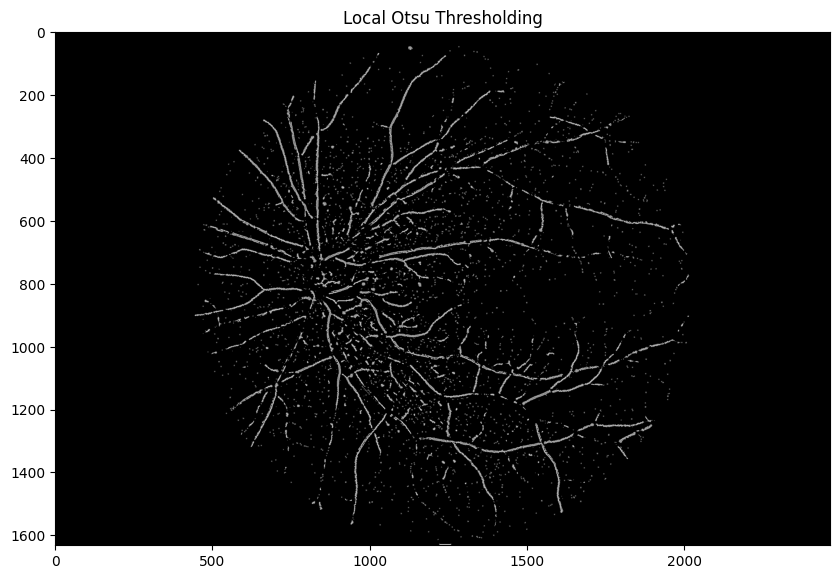

In [52]:
#local otsu thresholding on the fused image
lOtsu = LocalOtsu2(test1.astype('uint8'))
fig = plt.figure(figsize=(10, 10))
plt.imshow(lOtsu,cmap='gray')
plt.title("Local Otsu Thresholding")

Text(0.5, 1.0, 'Pixel/Area based Thresholding')

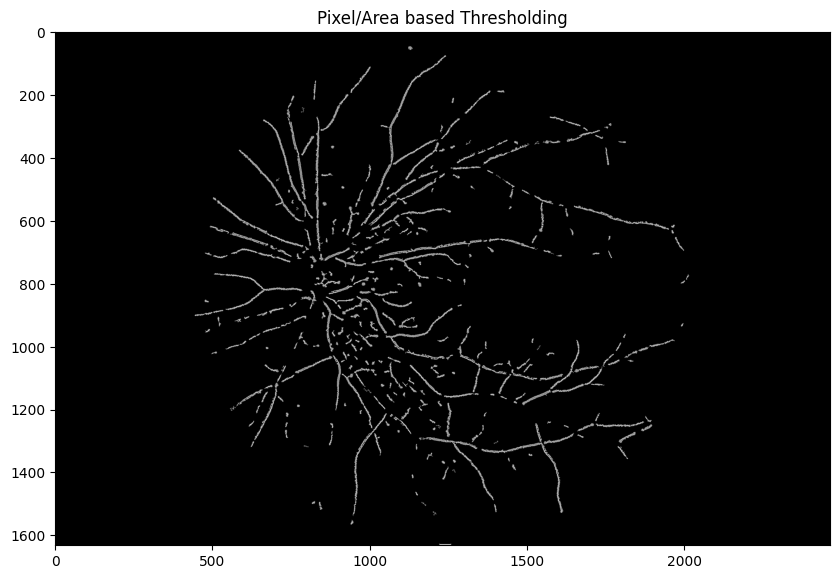

In [53]:
#area thresholding to remove non vessel regions
final = AreaThreshold(lOtsu,50)
fig = plt.figure(figsize=(10, 10))
plt.imshow(final,cmap='gray')
plt.title("Pixel/Area based Thresholding")

Text(0.5, 1.0, 'Final Output')

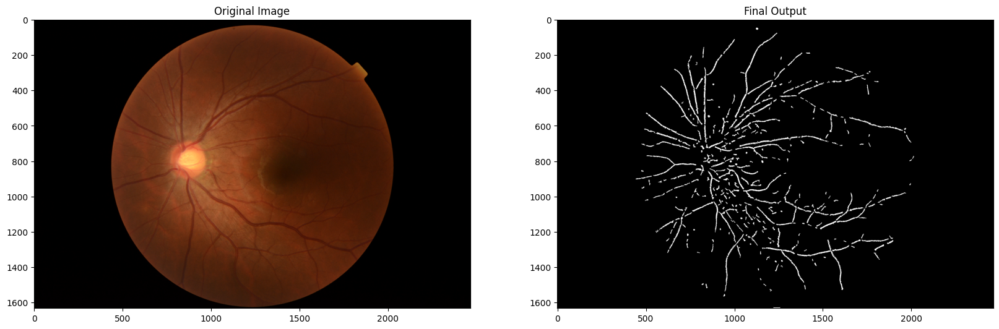

In [54]:
#binarizing final output and visualising it

final[final!=0] = 255
# fig = plt.figure(figsize=(10, 10))
# plt.imshow(final,cmap='gray')
# plt.title("Final Output")

fig = plt.figure(figsize=(20, 20))
fig.add_subplot(1, 2, 1)
plt.imshow(test_img)
plt.title('Original Image')
fig.add_subplot(1, 2, 2)
plt.imshow(final,cmap='gray')
plt.title("Final Output")

In [55]:
test_img1 = cv.imread('Catarac_Dataset/dataset/2_cataract/cataract_022.png')
test_img1 = cv.cvtColor(test_img1, cv.COLOR_BGR2RGB)
green_channel1 = test_img1[:, :, 1]
clahe1 = cv.createCLAHE(clipLimit=3, tileGridSize=(8,8))
clahe_img1 = clahe1.apply(green_channel1)
cell_disc1 = cv.getStructuringElement(cv.MORPH_ELLIPSE,(9,9))
Topen1 = cv.morphologyEx(clahe_img1,cv.MORPH_OPEN,cell_disc1)
Tclose1 = cv.morphologyEx(Topen1, cv.MORPH_CLOSE, cell_disc1)
TopHat1 = (clahe_img1 - Tclose1)#.astype(np.uint8)
kernel1 = cv.getStructuringElement(cv.MORPH_RECT,(2,2))
min_image1 = cv.erode(TopHat1, kernel1)
min_image1 = cv.dilate(min_image1, kernel1)
HessThin1 = hessian_matrix(min_image1, sigma=1.2, order='rc')
EignThin1 = hessian_matrix_eigvals(HessThin1) [1]
HessWide1 = hessian_matrix(min_image1, sigma=4, order='rc')
EignWide1 = hessian_matrix_eigvals(HessWide1) [1]
val11 = GlobalOtsu(1-EignWide1)
thinN1 = cv.normalize(1-EignThin1,  None, 0, 255, cv.NORM_MINMAX)
val11 = cv.normalize(val11,  None, 0, 70, cv.NORM_MINMAX)
test11 = image_fusion(val11,thinN1)
lOtsu1 = LocalOtsu2(test11.astype('uint8'))
final1 = AreaThreshold(lOtsu1,50)

test_img_ROI_resize = cv.resize(final1, (width, height))

C:\Users\Acer Nitro 5\AppData\Local\Temp\ipykernel_23632\1208595208.py:13: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  HessThin1 = hessian_matrix(min_image1, sigma=1.2, order='rc')
C:\Users\Acer Nitro 5\AppData\Local\Temp\ipykernel_23632\1208595208.py:15: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  HessWide1 = hessian_matrix(min_image1, sigma=4, order='rc')


Text(0.5, 1.0, 'Final Output')

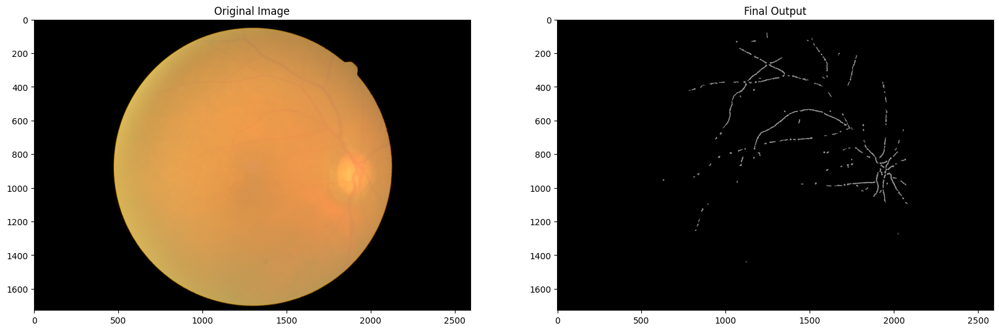

In [56]:
fig = plt.figure(figsize=(20, 20))
fig.add_subplot(1, 2, 1)
plt.imshow(test_img1)
plt.title('Original Image')
fig.add_subplot(1, 2, 2)
plt.imshow(final1,cmap='gray')
plt.title("Final Output")

In [31]:
def glcm_feature(matrix_coocurrence, featureName):
    feature = graycoprops(matrix_coocurrence, featureName)
    result = np.average(feature)
    return result
distance = 10
teta = 90

contrast_test = []
homogeneity_test = []
energy_test = []
correlation_test = []

Preprocessing

In [32]:
def preprocessingImage(image):
    test_img = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    green_channel = test_img[:, :, 1]
    clahe = cv.createCLAHE(clipLimit=3, tileGridSize=(8,8))
    clahe_img = clahe.apply(green_channel)
    cell_disc = cv.getStructuringElement(cv.MORPH_ELLIPSE,(9,9))
    Topen = cv.morphologyEx(clahe_img,cv.MORPH_OPEN,cell_disc)
    Tclose = cv.morphologyEx(Topen, cv.MORPH_CLOSE, cell_disc)
    TopHat = (clahe_img - Tclose)#.astype(np.uint8)
    kernel = cv.getStructuringElement(cv.MORPH_RECT,(2,2))
    min_image = cv.erode(TopHat, kernel)
    min_image = cv.dilate(min_image, kernel)
    HessThin = hessian_matrix(min_image, sigma=1.2, order='rc')
    EignThin = hessian_matrix_eigvals(HessThin) [1]
    HessWide = hessian_matrix(min_image, sigma=4, order='rc')
    EignWide = hessian_matrix_eigvals(HessWide) [1]
    val1 = GlobalOtsu(1-EignWide)
    thinN = cv.normalize(1-EignThin,  None, 0, 255, cv.NORM_MINMAX)
    val1 = cv.normalize(val1,  None, 0, 70, cv.NORM_MINMAX)
    test1 = image_fusion(val1,thinN)
    lOtsu = LocalOtsu2(test1.astype('uint8'))
    final = AreaThreshold(lOtsu,50)

    test_img_ROI_resize = cv.resize(final, (width, height))
    
    return test_img_ROI_resize

In [33]:
file_normal = 301
file_cataract = 101
file_glaucoma = 102
file_retina = 101
width, height = 400, 400
distance = 10
teta = 90
data_eye = np.zeros((5, 601))
count = 0
indextable = ['contrast', 'homogenity', 'energy', 'correlation', 'Label']

normal_dataset_path = 'Catarac_Dataset/dataset/1_normal/'
cataract_dataset_path = 'Catarac_Dataset/dataset/2_cataract/'
glaucoma_dataset_path = 'Catarac_Dataset/dataset/2_glaucoma/'
retina_dataset_path = 'Catarac_Dataset/dataset/3_retina_disease/'

In [34]:
for file in range(1, file_normal):
    contrast = []
    homogeneity = []
    energy = []
    correlation = []
    label = 0
    image = cv.imread(f'{normal_dataset_path}/NL_{str(file).zfill(3)}.png')
    img = preprocessingImage(image)
    
    glcm = graycomatrix(img, [distance], [teta], levels=256, symmetric=True, normed=True)
    contrast.append(glcm_feature(glcm, 'contrast'))
    homogeneity.append(glcm_feature(glcm, 'homogeneity'))
    energy.append(glcm_feature(glcm, 'energy'))
    correlation.append(glcm_feature(glcm, 'correlation'))
    
    data_eye[0, count] = contrast[0]
    data_eye[1, count] = homogeneity[0]
    data_eye[2, count] = energy[0]
    data_eye[3, count] = correlation[0]
    data_eye[4, count] = label
    
    count += 1

C:\Users\Acer Nitro 5\AppData\Local\Temp\ipykernel_3068\3846329808.py:13: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  HessThin = hessian_matrix(min_image, sigma=1.2, order='rc')
C:\Users\Acer Nitro 5\AppData\Local\Temp\ipykernel_3068\3846329808.py:15: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  HessWide = hessian_matrix(min_image, sigma=4, order='rc')


In [35]:
for file in range(1, file_cataract):
    contrast = []
    homogeneity = []
    energy = []
    correlation = []
    label = 1
    image = cv.imread(f'{cataract_dataset_path}/cataract_{str(file).zfill(3)}.png')
    img = preprocessingImage(image)
    
    glcm = graycomatrix(img, [distance], [teta], levels=256, symmetric=True, normed=True)
    contrast.append(glcm_feature(glcm, 'contrast'))
    homogeneity.append(glcm_feature(glcm, 'homogeneity'))
    energy.append(glcm_feature(glcm, 'energy'))
    correlation.append(glcm_feature(glcm, 'correlation'))
    
    data_eye[0, count] = contrast[0]
    data_eye[1, count] = homogeneity[0]
    data_eye[2, count] = energy[0]
    data_eye[3, count] = correlation[0]
    data_eye[4, count] = label
    
    count += 1

C:\Users\Acer Nitro 5\AppData\Local\Temp\ipykernel_3068\3846329808.py:13: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  HessThin = hessian_matrix(min_image, sigma=1.2, order='rc')
C:\Users\Acer Nitro 5\AppData\Local\Temp\ipykernel_3068\3846329808.py:15: FutureWarning: use_gaussian_derivatives currently defaults to False, but will change to True in a future version. Please specify this argument explicitly to maintain the current behavior
  HessWide = hessian_matrix(min_image, sigma=4, order='rc')


In [36]:
df= pd.DataFrame(np.transpose(data_eye), columns = indextable)

In [37]:
df

,contrast,homogenity,energy,correlation,Label
0,1217.702724,0.933259,0.932703,0.053752,0.0
1,1815.789067,0.902118,0.901400,0.065327,0.0
2,401.812395,0.976720,0.976505,0.073610,0.0
3,451.669340,0.972366,0.972172,0.074809,0.0
4,1363.029980,0.928303,0.927848,0.046059,0.0
...,...,...,...,...,...
596,0.000000,0.000000,0.000000,0.000000,0.0
597,0.000000,0.000000,0.000000,0.000000,0.0
598,0.000000,0.000000,0.000000,0.000000,0.0
599,0.000000,0.000000,0.000000,0.000000,0.0


In [38]:
df.to_csv('Paper_data.csv', index=False)

In [3]:
data = pd.read_csv('Paper_data.csv')

In [4]:
data = data.iloc[:400]

In [5]:
data.describe()

,contrast,homogenity,energy,correlation,Label
count,400.000000,400.000000,400.000000,400.000000,400.000000
mean,1289.818326,0.927707,0.927176,0.058618,0.250000
std,611.830368,0.031231,0.031455,0.015149,0.433555
min,137.900062,0.845664,0.844592,0.010965,0.000000
25%,789.406118,0.904023,0.903275,0.050343,0.000000
50%,1351.860540,0.925881,0.925323,0.057947,0.000000
75%,1749.068967,0.950089,0.949725,0.066890,0.250000
max,2860.211908,0.991711,0.991649,0.137222,1.000000


In [6]:
from sklearn.preprocessing import MinMaxScaler
features = data.drop(['Label'], axis='columns')
features_scaler = MinMaxScaler()
features = features_scaler.fit_transform(features)
features

array([[0.39664914, 0.5997697 , 0.59915981, 0.33889282],
       [0.6163471 , 0.38654494, 0.38630078, 0.43057127],
       [0.0969442 , 0.89735274, 0.89701753, 0.49617561],
       ...,
       [0.10023055, 0.89668132, 0.89666602, 0.38600056],
       [0.05155052, 0.90296338, 0.90259564, 0.40109559],
       [0.15615894, 0.85060909, 0.8503362 , 0.30001926]])

In [7]:
from sklearn.preprocessing import StandardScaler
features = data.drop(['Label'], axis='columns')
features_scaler = StandardScaler()
features = features_scaler.fit_transform(features)
features

array([[-0.11801623,  0.17800053,  0.17593229, -0.32162078],
       [ 0.8607442 , -0.82035973, -0.8204823 ,  0.44340131],
       [-1.45321003,  1.57134282,  1.57023434,  0.99084474],
       ...,
       [-1.43856922,  1.56819911,  1.56858887,  0.07147559],
       [-1.65544008,  1.59761293,  1.59634603,  0.19743786],
       [-1.18940673,  1.35247988,  1.35171434, -0.64600589]])

In [8]:
data_normalization = data.copy()
data_normalization[['contrast', 'homogenity', 'energy', 'correlation']] = features
data_normalization

,contrast,homogenity,energy,correlation,Label
0,-0.118016,0.178001,0.175932,-0.321621,0.0
1,0.860744,-0.820360,-0.820482,0.443401,0.0
2,-1.453210,1.571343,1.570234,0.990845,0.0
3,-1.371620,1.431758,1.432297,1.070052,0.0
4,0.119810,0.019130,0.021390,-0.830099,0.0
...,...,...,...,...,...
395,-1.590570,1.708863,1.708583,-0.684008,1.0
396,-1.594632,1.771977,1.772928,-1.243817,1.0
397,-1.438569,1.568199,1.568589,0.071476,1.0
398,-1.655440,1.597613,1.596346,0.197438,1.0


In [9]:
data_normalization.describe()

,contrast,homogenity,energy,correlation,Label
count,4.000000e+02,4.000000e+02,4.000000e+02,4.000000e+02,400.000000
mean,-2.131628e-16,2.238210e-15,-8.881784e-16,5.329071e-17,0.250000
std,1.001252e+00,1.001252e+00,1.001252e+00,1.001252e+00,0.433555
min,-1.885099e+00,-2.630239e+00,-2.628795e+00,-3.149553e+00,0.000000
25%,-8.189180e-01,-7.592809e-01,-7.607898e-01,-5.469712e-01,0.000000
50%,1.015313e-01,-5.852804e-02,-5.898622e-02,-4.440715e-02,0.000000
75%,7.515576e-01,7.175699e-01,7.177677e-01,5.466532e-01,0.250000
max,2.569928e+00,2.051957e+00,2.052306e+00,5.195069e+00,1.000000


In [10]:
x = data_normalization.drop(['Label'], axis='columns')
y = data_normalization.Label

Classification using Machine Learning Alghoritm

In [11]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier

model_params = {
    'svm_rbf': {
        'model': svm.SVC(gamma='auto'),
        'params': {
            'C': [0.1, 1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
            'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
            'degree': [2, 3, 4],
            'coef0': [0.0, 1.0, 2.0]
        }
    },
    'svm_linear': {
        'model': svm.SVC(kernel='linear'),
        'params': {
            'C': [0.1, 1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
        }
    },
    'random_forest': {
        'model': RandomForestClassifier(),
        'params': {
            'n_estimators': [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
            'max_depth': [None, 5, 10, 20],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'max_features': ['auto', 'sqrt', 'log2']
        }
    },
    'logistic_regression': {
        'model': LogisticRegression(solver='liblinear', multi_class='auto'),
        'params': {
            'C': [0.1, 1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
            'penalty': ['l1', 'l2'],
            'max_iter': [100, 200, 300]
        }
    },
    'KNN': {
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
            'weights': ['uniform', 'distance'],
            'p': [1, 2]
        }
    },
    'decision_tree': {
        'model': DecisionTreeClassifier(),
        'params': {
            'criterion': ['gini', 'entropy'],
            'max_depth': [None, 10, 20, 30, 40, 50],
            'min_samples_split': [2, 5, 10, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100],
            'min_samples_leaf': [1, 2, 4]
        }
    },
    'adaboost': {
        'model': AdaBoostClassifier(),
        'params': {
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.001, 0.01, 0.1, 1.0]
        }
    },
    'gradient_boosting': {
        'model': GradientBoostingClassifier(),
        'params': {
            'n_estimators': [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 200],
            'learning_rate': [0.001, 0.01, 0.1, 1.0],
            'max_depth': [3, 5, 7],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        }
    },
    'xgboost': {
        'model': XGBClassifier(),
        'params': {
            'n_estimators': [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 200],
            'learning_rate': [0.001, 0.01, 0.1, 1.0],
            'max_depth': [3, 5, 7],
            'min_child_weight': [1, 5, 10],
            'subsample': [0.8, 1.0],
            'colsample_bytree': [0.8, 1.0]
        }
    }
}

In [12]:
from sklearn.model_selection import GridSearchCV
scores = []

for model_name, mp in model_params.items():
    clf =  GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
    clf.fit(x, y)
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })
    
df_score = pd.DataFrame(scores,columns=['model','best_score','best_params'])
df_score

c:\Users\Acer Nitro 5\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Acer Nitro 5\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
c:\Users\Acer Nitro 5\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the pas

,model,best_score,best_params
0,svm_rbf,0.8925,"{'C': 1, 'coef0': 2.0, 'degree': 2, 'kernel': ..."
1,svm_linear,0.8775,{'C': 5}
2,random_forest,0.8900,"{'max_depth': 5, 'max_features': 'auto', 'min_..."
3,logistic_regression,0.8850,"{'C': 1, 'max_iter': 100, 'penalty': 'l1'}"
4,KNN,0.8675,"{'n_neighbors': 15, 'p': 1, 'weights': 'distan..."
5,decision_tree,0.8925,"{'criterion': 'gini', 'max_depth': None, 'min_..."
6,adaboost,0.8825,"{'learning_rate': 0.001, 'n_estimators': 50}"
7,gradient_boosting,0.8900,"{'learning_rate': 1.0, 'max_depth': 3, 'min_sa..."
8,xgboost,0.8850,"{'colsample_bytree': 0.8, 'learning_rate': 0.1..."


In [13]:
df_score.to_csv('Best_Param_paper.csv', index=False)

In [11]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.25, random_state=42)

Text(95.72222222222221, 0.5, 'Truth')

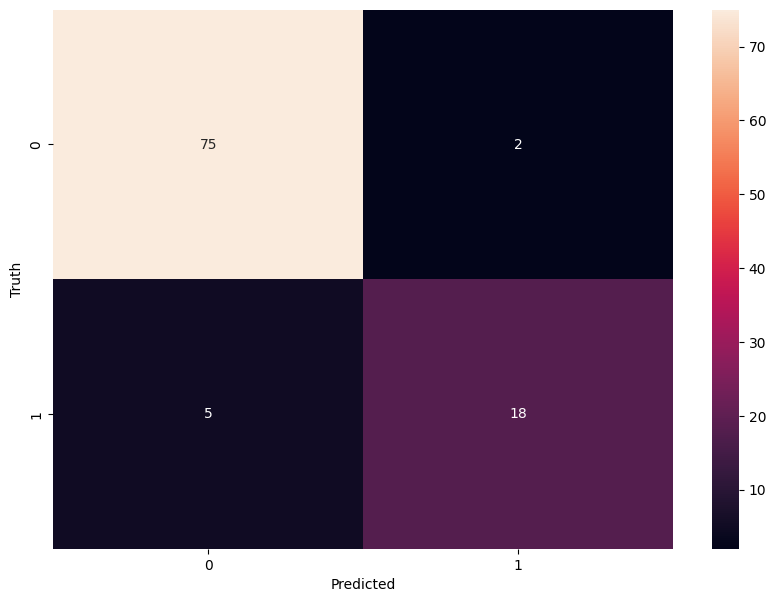

In [16]:
model = svm.SVC(C=1, kernel='poly', degree=2, coef0=2.0)
model.fit(x_train,y_train)
model.score(x_test,y_test)

from sklearn.metrics import confusion_matrix
import seaborn as sb
y_predicted = model.predict(x_test)
cm = confusion_matrix(y_test,y_predicted)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [17]:
model.score(x_test,y_test)

0.93

In [18]:
accuracy = accuracy_score(y_test, y_predicted)
print(f"Accuracy: {accuracy}")

# Display additional metrics
print("\nClassification Report:")
print(classification_report(y_test, y_predicted))

Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96        77
         1.0       0.90      0.78      0.84        23

    accuracy                           0.93       100
   macro avg       0.92      0.88      0.90       100
weighted avg       0.93      0.93      0.93       100



Random Forest

Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96        77
         1.0       0.90      0.78      0.84        23

    accuracy                           0.93       100
   macro avg       0.92      0.88      0.90       100
weighted avg       0.93      0.93      0.93       100



c:\Users\Acer Nitro 5\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


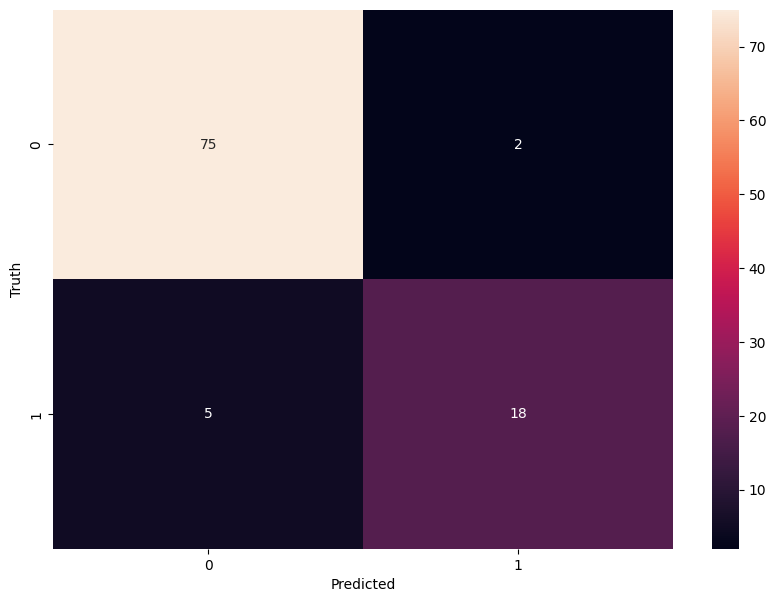

In [19]:
# Create a Random Forest classifier
rf_classifier = RandomForestClassifier(
    max_depth=5,
    max_features='auto',
    min_samples_leaf=1,
    min_samples_split=10,
    n_estimators=90,
    random_state=42
)

rf_classifier.fit(x_train, y_train)

# Make predictions on the testing data
y_pred2 = rf_classifier.predict(x_test)
rf_classifier.score(x_test,y_test)
cm = confusion_matrix(y_test,y_pred2)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

accuracy = accuracy_score(y_test, y_pred2)
print(f"Accuracy: {accuracy}")

# Display additional metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred2))

logistic_regression

Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96        77
         1.0       0.90      0.78      0.84        23

    accuracy                           0.93       100
   macro avg       0.92      0.88      0.90       100
weighted avg       0.93      0.93      0.93       100



Text(95.72222222222221, 0.5, 'Truth')

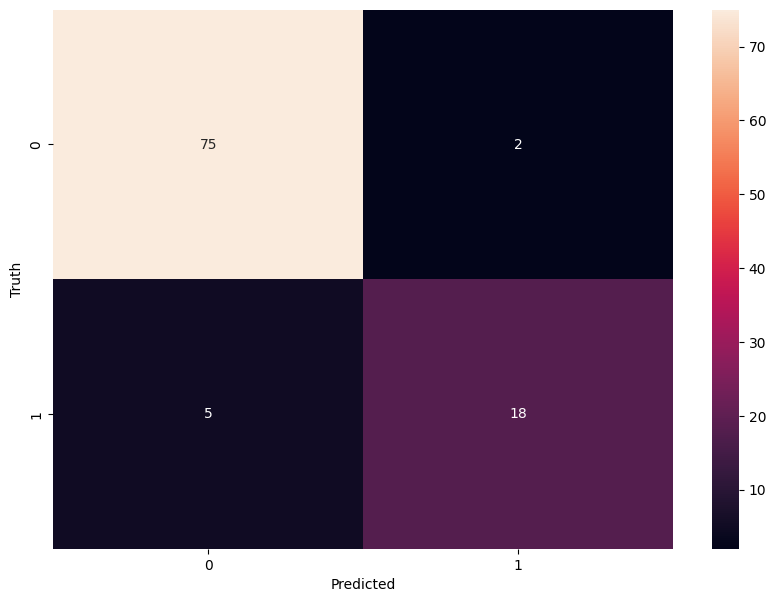

In [20]:
# Create a Logistic Regression model with adjusted C parameter
logistic_reg_model = LogisticRegression(
    C=1,
    max_iter=100,
    penalty='l2',
    solver='liblinear',
    random_state=42
)

# You can experiment with different values for C, such as 0.1, 1.0, 10.0, etc.

# Train the model on the training data
logistic_reg_model.fit(x_train, y_train)

# Make predictions on the testing data
y_pred3 = logistic_reg_model.predict(x_test)

# Evaluate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred3)
print(f"Accuracy: {accuracy}")

# Display additional metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred3))

cm = confusion_matrix(y_test,y_pred3)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

KNN

Accuracy: 0.91

Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.96      0.94        77
         1.0       0.85      0.74      0.79        23

    accuracy                           0.91       100
   macro avg       0.89      0.85      0.87       100
weighted avg       0.91      0.91      0.91       100



Text(95.72222222222221, 0.5, 'Truth')

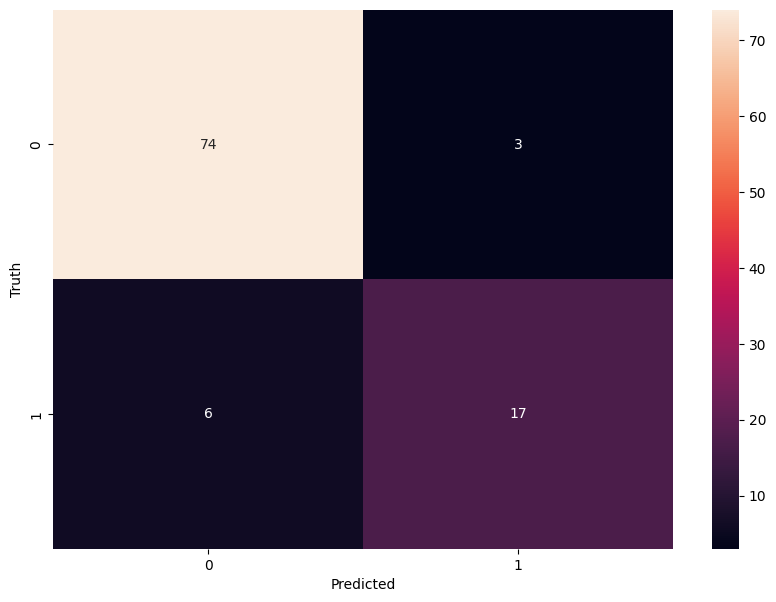

In [21]:
knn_classifier = KNeighborsClassifier(
    n_neighbors=15,
    p=1,
    weights='distance'
)

# Train the classifier on the training data
knn_classifier.fit(x_train, y_train)

# Make predictions on the testing data
y_pred4 = knn_classifier.predict(x_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred4)
print(f"Accuracy: {accuracy}")

# Display additional metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred4))

cm = confusion_matrix(y_test,y_pred4)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

Decision Tree

Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96        77
         1.0       0.90      0.78      0.84        23

    accuracy                           0.93       100
   macro avg       0.92      0.88      0.90       100
weighted avg       0.93      0.93      0.93       100



Text(95.72222222222221, 0.5, 'Truth')

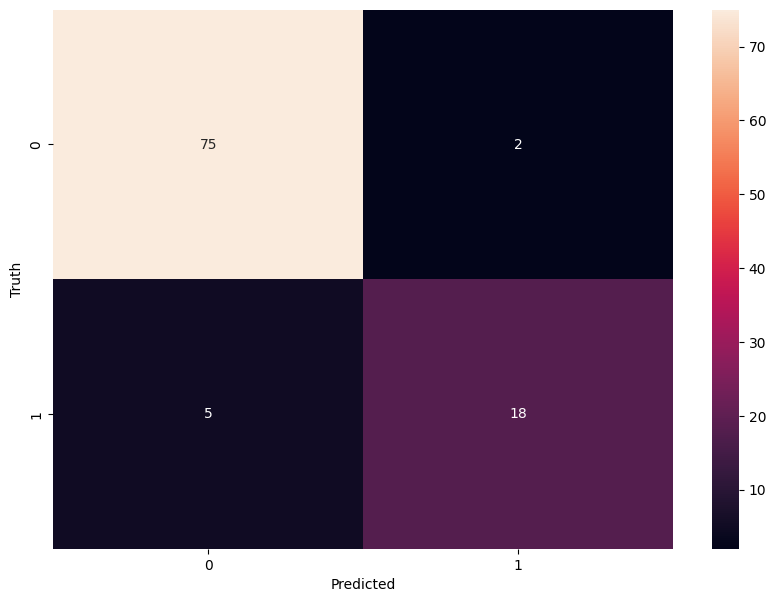

In [22]:
decision_tree_classifier = DecisionTreeClassifier(
    criterion='gini',
    max_depth=None,
    min_samples_leaf=1,
    min_samples_split=80,
    random_state=42
)

# Train the classifier on the training data
decision_tree_classifier.fit(x_train, y_train)

# Make predictions on the testing data
y_pred5 = decision_tree_classifier.predict(x_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred5)
print(f"Accuracy: {accuracy}")

# Display additional metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred5))

cm = confusion_matrix(y_test,y_pred5)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

Adaboost

Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96        77
         1.0       0.90      0.78      0.84        23

    accuracy                           0.93       100
   macro avg       0.92      0.88      0.90       100
weighted avg       0.93      0.93      0.93       100



Text(95.72222222222221, 0.5, 'Truth')

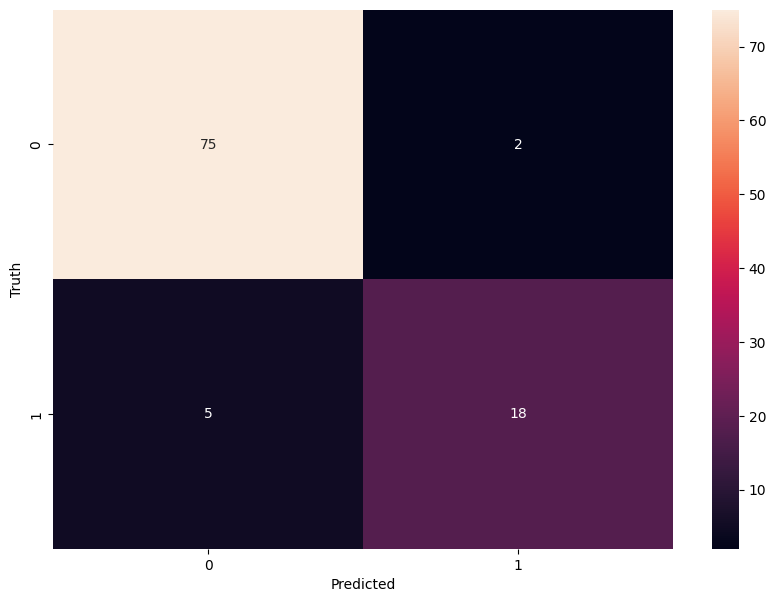

In [23]:
# Create an AdaBoost classifier with specified hyperparameters
adaboost_classifier = AdaBoostClassifier(
    learning_rate=0.001,
    n_estimators=50,
    random_state=42
)

# Train the classifier on the training data
adaboost_classifier.fit(x_train, y_train)

# Make predictions on the testing data
y_pred6 = adaboost_classifier.predict(x_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred6)
print(f"Accuracy: {accuracy}")

# Display additional metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred6))

cm = confusion_matrix(y_test,y_pred6)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

Gradient Boost

Accuracy: 0.91

Classification Report:
              precision    recall  f1-score   support

         0.0       0.91      0.97      0.94        77
         1.0       0.89      0.70      0.78        23

    accuracy                           0.91       100
   macro avg       0.90      0.83      0.86       100
weighted avg       0.91      0.91      0.91       100



Text(95.72222222222221, 0.5, 'Truth')

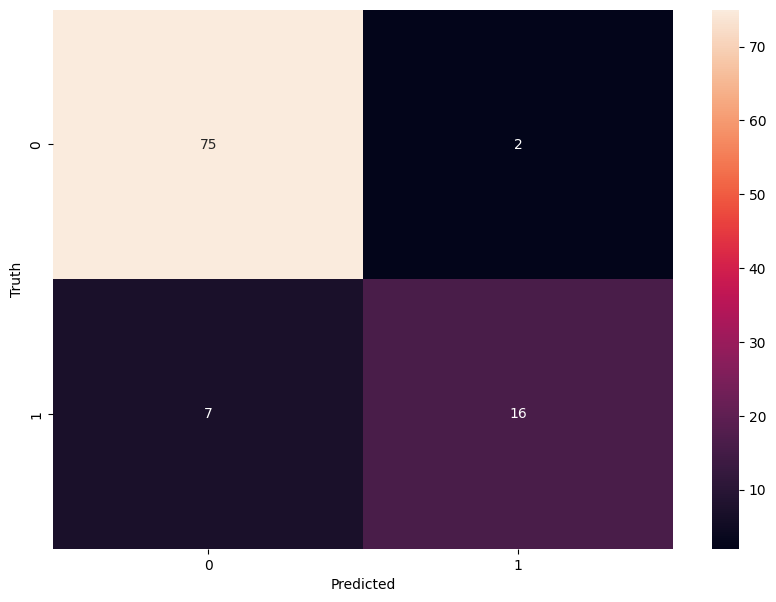

In [24]:
# Create a Gradient Boosting classifier with specified hyperparameters
gradient_boosting_classifier = GradientBoostingClassifier(
    learning_rate=1.0,
    max_depth=3,
    min_samples_leaf=1,
    min_samples_split=2,
    n_estimators=1,
    random_state=42
)

# Train the classifier on the training data
gradient_boosting_classifier.fit(x_train, y_train)

# Make predictions on the testing data
y_pred7 = gradient_boosting_classifier.predict(x_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred7)
print(f"Accuracy: {accuracy}")

# Display additional metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred7))

cm = confusion_matrix(y_test,y_pred7)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

XGBoost

Accuracy: 0.93

Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96        77
         1.0       0.90      0.78      0.84        23

    accuracy                           0.93       100
   macro avg       0.92      0.88      0.90       100
weighted avg       0.93      0.93      0.93       100



Text(95.72222222222221, 0.5, 'Truth')

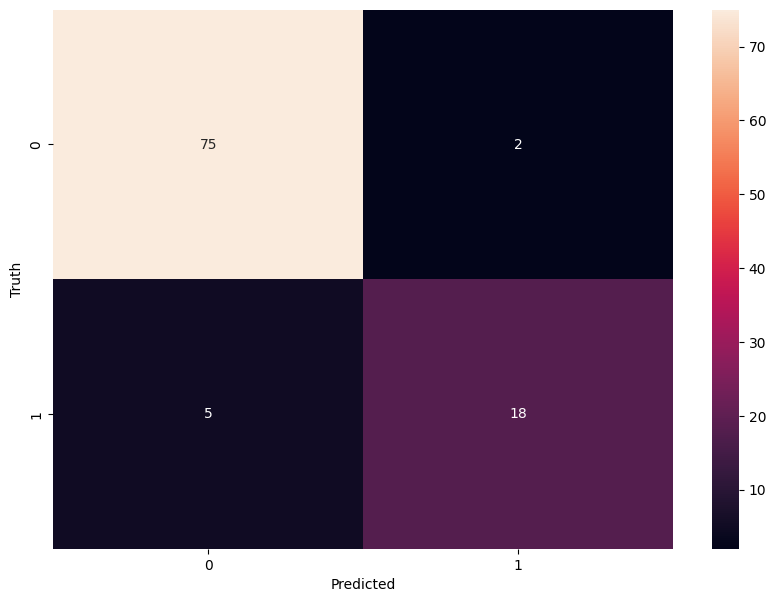

In [25]:
# Create an XGBoost classifier with specified hyperparameters
xgboost_classifier = XGBClassifier(
    colsample_bytree=0.8,
    learning_rate=0.1,
    max_depth=3,
    min_child_weight=1,
    n_estimators=5,
    subsample=1.0,
    random_state=42
)

# Train the classifier on the training data
xgboost_classifier.fit(x_train, y_train)

# Make predictions on the testing data
y_pred8 = xgboost_classifier.predict(x_test)

# Evaluate the accuracy of the classifier
accuracy = accuracy_score(y_test, y_pred8)
print(f"Accuracy: {accuracy}")

# Display additional metrics
print("\nClassification Report:")
print(classification_report(y_test, y_pred8))

cm = confusion_matrix(y_test,y_pred8)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

In [12]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Create individual models with probability=True
model_svc = SVC(C=1, kernel='poly', degree=2, coef0=2.0, probability=True, random_state=42)
model_rf = RandomForestClassifier(max_depth=5, max_features='auto', min_samples_leaf=1, min_samples_split=10, n_estimators=90, random_state=42)
model_lr = LogisticRegression(C=1, max_iter=100, penalty='l1', solver='liblinear', random_state=42)
model_knn = KNeighborsClassifier(n_neighbors=15, p=1, weights='distance')
model_dt = DecisionTreeClassifier(criterion='gini', max_depth=None, min_samples_leaf=1, min_samples_split=80, random_state=42)
model_ab = AdaBoostClassifier(learning_rate=0.001, n_estimators=50, random_state=42)
model_gb = GradientBoostingClassifier(learning_rate=1.0, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=1, random_state=42)
model_xgb = XGBClassifier(colsample_bytree=0.8, learning_rate=0.1, max_depth=3, min_child_weight=1, n_estimators=5, subsample=1.0, random_state=42)

# Combine models in a soft voting classifier
voting_clf = VotingClassifier(
    estimators=[
        ('rf', model_rf), ('svc', model_svc), ('lr', model_lr),
        ('knn', model_knn), ('dt', model_dt),
        ('ab', model_ab), ('gb', model_gb), ('xgb', model_xgb)
    ],
    voting='soft'
)

# Train the ensemble model
voting_clf.fit(x_train, y_train)

# Predict probabilities using predict_proba
proba_predictions = voting_clf.predict_proba(x_test)

# Select the class with the highest probability as the final prediction
y_pred9 = voting_clf.predict(x_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred9)
print(f'Accuracy: {accuracy:.2f}')


c:\Users\Acer Nitro 5\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\ensemble\_forest.py:427: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(


Accuracy: 0.93


In [13]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred9))


Classification Report:
              precision    recall  f1-score   support

         0.0       0.94      0.97      0.96        77
         1.0       0.90      0.78      0.84        23

    accuracy                           0.93       100
   macro avg       0.92      0.88      0.90       100
weighted avg       0.93      0.93      0.93       100



Text(37.25, 0.5, 'Truth')

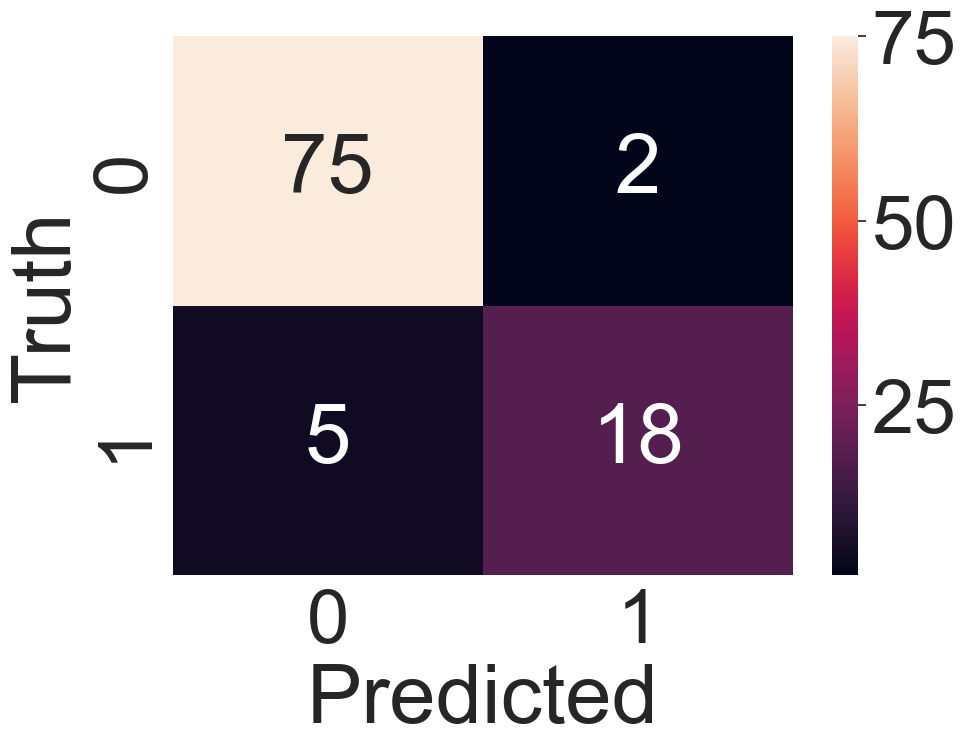

In [14]:
from sklearn.metrics import confusion_matrix
import seaborn as sb

sb.set(font_scale=5)

cm = confusion_matrix(y_test,y_pred9)
plt.figure(figsize = (10,7))
sb.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')